<a href="https://colab.research.google.com/github/eluo28/DetectMySetup/blob/master/Computer_Setup_Detection_with_Detectron_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Creating a computer setup detection application with Detectron2.

with the help of [this tutorial on replicating Airbnb's Amenity Detection](https://github.com/mrdbourke/airbnb-amenity-detection/)

This application should be able to receive an image of a computer setup and return a list of computer amenities.

Purpose? to learn more about the implementation and deployment of machine learning models.

# Installations + imports



In [ ]:
# Install Detectron2 dependencies: https://detectron2.readthedocs.io/tutorials/install.html (use cu100 because colab is on CUDA 10.0)
!pip install -U torch==1.4+cu100 torchvision==0.5+cu100 -f https://download.pytorch.org/whl/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

!pip install awscli # needed to download images from Open Images

# Make sure we can import PyTorch (what Detectron2 is built with)
import torch, torchvision
torch.__version__
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/torch_stable.html
Requirement already up-to-date: torch==1.4+cu100 in /usr/local/lib/python3.6/dist-packages (1.4.0+cu100)
Requirement already up-to-date: torchvision==0.5+cu100 in /usr/local/lib/python3.6/dist-packages (0.5.0+cu100)
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-eyjaiu8c
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-eyjaiu8c
  Created wheel for pycocotools: filename=pycocotools-2.0-cp36-cp36m-linux_x86_64.whl size=266464 sha256=e8e02ee9f63412ba18e3879f375c12316f9875bd435726376861a88e28b28c45
  Stored in directory: /tmp/pip-ephem-wheel-cache-dsep3uo_/wheels/90/51/41/646daf401c3bc408ff10de34ec76587a9b3ebfac8d21ca5c3a
Successfully built pycocotools
ERROR: detectron2 0.2.1+cu100 has requirement pycocotools>=2.0.1, but you'll have pycocotools 2.0 which is incompatible.
  Found existing installation: pycocotools 2.0.1
    Uninstalling pycocotools-2.0

gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [ ]:
!pip install wandb

In [ ]:
# install detectron2:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu100/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu100/index.html
     |████████████████████████████████| 6.7MB 1.6MB/s 
     |████████████████████████████████| 2.2MB 26.7MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.1.post20200716-cp36-none-any.whl size=42325 sha256=8e0d2b69c9ef10870c61e76427a1ab1bab19a26413e6bb461da58ff611602905
  Stored in directory: /root/.cache/pip/wheels/81/99/f4/42a6bef61c07b3d78dfe6d7ebff259444c4526504cf72378d7
  Created wheel for pycocotools: filename=pycocotools-2.0.1-cp36-cp36m-linux_x86_64.whl size=266506 sha256=265e7002ffde674d91246bd43bb60ac5eb974c4f5f57a1e392f263985c0b5deb
  Stored in directory: /root/.cache/pip/wheels/86/19/08/49b25f258ead1f861c9ab2fc41f73636f2928859adbb0e9797
Successfully built fvcore pycocotools
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully unin

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger() # this logs Detectron2 information such as what the model is doing when it's training

#import wandb


# import some common libraries
import numpy as np
import pandas as pd
from tqdm import tqdm
import cv2
import random
from google.colab.patches import cv2_imshow

from detectron2.structures import BoxMode
import json
import pprint

import logging
import os
import argparse
from collections import OrderedDict

from torch.nn.parallel import DistributedDataParallel

import detectron2.utils.comm as comm
from detectron2.checkpoint import DetectionCheckpointer, PeriodicCheckpointer


from detectron2.data import (
    MetadataCatalog,
    DatasetCatalog,
    build_detection_test_loader,
    build_detection_train_loader,
)

from detectron2.engine import default_argument_parser, default_setup, launch, DefaultPredictor
from detectron2.evaluation import ( ### Changes from original, I don't need all the different evaluators
    COCOEvaluator,
    DatasetEvaluators,
    inference_on_dataset,
    print_csv_format
)
from detectron2.modeling import build_model
from detectron2.solver import build_lr_scheduler, build_optimizer
# Not sure what these do but they may help to track experiments
from detectron2.utils.events import (
    CommonMetricPrinter,
    EventStorage,
    JSONWriter,
    TensorboardXWriter
)


# import some common detectron2 utilities
from detectron2 import model_zoo # a series of pre-trained Detectron2 models: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md
from detectron2.config import get_cfg # a config of "cfg" in Detectron2 is a series of instructions for building a model
from detectron2.utils.visualizer import Visualizer # a class to help visualize Detectron2 predictions on an image


In [ ]:
!wandb login

wandb: You can find your API key in your browser here: https://app.wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter: Aborted!
^C


In [ ]:
!nvidia-smi

Wed Jul 29 21:31:32 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.51.05    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P8     9W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Test running pretrained model

In [ ]:
# Download and display example image and save it as demo.jpeg
!wget --no-proxy https://raw.githubusercontent.com/mrdbourke/airbnb-amenity-detection/master/custom_images/airbnb-article-cover.jpeg -O demo.jpeg
img = cv2.imread("./demo.jpeg")
cv2_imshow(img)

In [ ]:
# Download the trained model
!wget https://storage.googleapis.com/airbnb-amenity-detection-storage/airbnb-amenity-detection/open-images-data/retinanet_model_final/retinanet_model_final.pth 

# Download the train model config (instructions on how the model was built)
!wget https://storage.googleapis.com/airbnb-amenity-detection-storage/airbnb-amenity-detection/open-images-data/retinanet_model_final/retinanet_model_final_config.yaml

--2020-07-26 16:16:51--  https://storage.googleapis.com/airbnb-amenity-detection-storage/airbnb-amenity-detection/open-images-data/retinanet_model_final/retinanet_model_final.pth
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.124.128, 172.217.212.128, 172.217.214.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.124.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 446656531 (426M) [application/octet-stream]
Saving to: ‘retinanet_model_final.pth’

retinanet_model_fin 100%[===================>] 425.96M   197MB/s    in 2.2s    

2020-07-26 16:16:54 (197 MB/s) - ‘retinanet_model_final.pth’ saved [446656531/446656531]

--2020-07-26 16:16:54--  https://storage.googleapis.com/airbnb-amenity-detection-storage/airbnb-amenity-detection/open-images-data/retinanet_model_final/retinanet_model_final_config.yaml
Resolving storage.googleapis.com (storage.googleapis.com)... 108.177.111.128, 108.177.121.128, 173.194.197.128, .

In [ ]:
# Target classes with spaces removed
target_classes = ['Bathtub',
 'Bed',
 'Billiard table',
 'Ceiling fan',
 'Coffeemaker',
 'Couch',
 'Countertop',
 'Dishwasher',
 'Fireplace',
 'Fountain',
 'Gas stove',
 'Jacuzzi',
 'Kitchen & dining room table',
 'Microwave oven',
 'Mirror',
 'Oven',
 'Pillow',
 'Porch',
 'Refrigerator',
 'Shower',
 'Sink',
 'Sofa bed',
 'Stairs',
 'Swimming pool',
 'Television',
 'Toilet',
 'Towel',
 'Tree house',
 'Washing machine',
 'Wine rack']

In [ ]:
# Setup a model config file (set of instructions for the model)
cfg = get_cfg() # setup a default config, see: https://detectron2.readthedocs.io/modules/config.html
cfg.merge_from_file("./retinanet_model_final_config.yaml") # merge the config YAML file (a set of instructions on how to build a model)
cfg.MODEL.WEIGHTS = "./retinanet_model_final.pth" # setup the model weights from the fully trained model

# Create a default Detectron2 predictor for making inference
predictor = DefaultPredictor(cfg)

# Make a prediction the example image from above
outputs = predictor(img)

In [ ]:
# Number of predicted amenities to draw on the target image
num_amenities = 7

# Set up a visulaizer instance: https://detectron2.readthedocs.io/modules/utils.html#detectron2.utils.visualizer.Visualizer
visualizer = Visualizer(img_rgb=img[:, :, ::-1], # we have to reverse the color order otherwise we'll get blue images (BGR -> RGB)
                        metadata=MetadataCatalog.get(cfg.DATASETS.TEST[0]).set(thing_classes=target_classes), # we tell the visualizer what classes we're drawing (from the target classes)
                        scale=0.7)

# Draw the models predictions on the target image
visualizer = visualizer.draw_instance_predictions(outputs["instances"][:num_amenities].to("cpu"))

# Display the image
cv2_imshow(visualizer.get_image()[:, :, ::-1])

# Training Custom Model

1. Download data (images) & label files from Open Images
2. Format the data (images) & label files to be compatiable with Detectron2
3. Download a pretrained Detectron2 model and update it (train it) with our own data
4. Verify the updated model works on our own images by making predictions
5. Evaluate the model using a validation/test set and Detectron2 evaluators

In [ ]:
#download label files

# Training bounding boxes (1.11G)
!wget https://storage.googleapis.com/openimages/2018_04/train/train-annotations-bbox.csv

# Validating bounding boxes (23.94M)
!wget https://storage.googleapis.com/openimages/v5/validation-annotations-bbox.csv
    
# Testing bounding boxes (73.89M)
!wget https://storage.googleapis.com/openimages/v5/test-annotations-bbox.csv

# Class names of images (11.73K)
!wget https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv

--2020-08-01 20:15:55--  https://storage.googleapis.com/openimages/2018_04/train/train-annotations-bbox.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.79.128, 108.177.119.128, 108.177.126.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.79.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1194033454 (1.1G) [text/csv]
Saving to: ‘train-annotations-bbox.csv’

train-annotations-b 100%[===================>]   1.11G  74.8MB/s    in 18s     

2020-08-01 20:16:14 (61.9 MB/s) - ‘train-annotations-bbox.csv’ saved [1194033454/1194033454]

--2020-08-01 20:16:15--  https://storage.googleapis.com/openimages/v5/validation-annotations-bbox.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 108.177.119.128, 108.177.126.128, 173.194.69.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|108.177.119.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 25105048 (24

In [ ]:
#run in cmd to get on local machine

# # Use tutorial download script to get images
# !git clone https://github.com/mrdbourke/airbnb-amenity-detection.git

# !python3 airbnb-amenity-detection/downloadOI.py --classes 'Laptop,Computer mouse,Computer monitor,Computer keyboard,Tablet Computer,Mobile phone,Microphone,Lamp' --dataset train
# !python3 airbnb-amenity-detection/downloadOI.py --classes 'Laptop,Computer_mouse,Computer_monitor,Computer_keyboard,Tablet_Computer,Mobile_phone,Microphone,Lamp' --dataset validation
# !python3 airbnb-amenity-detection/downloadOI.py --classes 'Laptop,Computer mouse,Computer monitor,Computer keyboard,Tablet Computer,Mobile phone,Microphone,Lamp' --dataset test


In [ ]:
!gsutil -m cp -r gs://detectmysetup/train sample_data

Streaming output truncated to the last 5000 lines.
Copying gs://detectmysetup/train/14ca9923a6e0056d.jpg...
Copying gs://detectmysetup/train/14ca36bb1701e197.jpg...
Copying gs://detectmysetup/train/14d48ef150d31748.jpg...
Copying gs://detectmysetup/train/14d8685f9b5d09bd.jpg...
Copying gs://detectmysetup/train/14ecfd20e8c4ac7f.jpg...
Copying gs://detectmysetup/train/14f448839759fc02.jpg...
Copying gs://detectmysetup/train/14f716708f701c85.jpg...
Copying gs://detectmysetup/train/14f789d5668ccd6b.jpg...
Copying gs://detectmysetup/train/14fa55590cc6090d.jpg...
Copying gs://detectmysetup/train/14fde17743eabdf9.jpg...
Copying gs://detectmysetup/train/15034743b19fc75f.jpg...
Copying gs://detectmysetup/train/1507fe902006cb91.jpg...
Copying gs://detectmysetup/train/150c6d8301b67758.jpg...
Copying gs://detectmysetup/train/1513e33effd3e7ed.jpg...
Copying gs://detectmysetup/train/151d2239e140564c.jpg...
Copying gs://detectmysetup/train/151d9735928de97a.jpg...
Copying gs://detectmysetup/train/1521

In [ ]:
!gsutil -m cp -r gs://detectmysetup/validation sample_data

Copying gs://detectmysetup/validation/00a36f96e31731c4.jpg...
Copying gs://detectmysetup/validation/007f71665b0812a7.jpg...
Copying gs://detectmysetup/validation/06349831cbcb8f2c.jpg...
Copying gs://detectmysetup/validation/04d357176397fb31.jpg...
Copying gs://detectmysetup/validation/0421a6e230527185.jpg...
Copying gs://detectmysetup/validation/06bc9b828cedce1c.jpg...
Copying gs://detectmysetup/validation/09ea349ee555b61d.jpg...
Copying gs://detectmysetup/validation/0b9aec984321bf53.jpg...
Copying gs://detectmysetup/validation/0c295283d2a46bd7.jpg...
Copying gs://detectmysetup/validation/0ccdb16a34d67aaa.jpg...
Copying gs://detectmysetup/validation/0d03c760fe72ad6e.jpg...
Copying gs://detectmysetup/validation/0e09767b7dab9237.jpg...
Copying gs://detectmysetup/validation/10651d2876cd50d8.jpg...
Copying gs://detectmysetup/validation/10cae64b8b77b511.jpg...
Copying gs://detectmysetup/validation/11aeb618075ac6d7.jpg...
Copying gs://detectmysetup/validation/124d86a6d3953a13.jpg...
Copying 

In [ ]:
# Setup the paths for the training and validation data
train_path = "./sample_data/train/"
valid_path = "./sample_data/validation/"


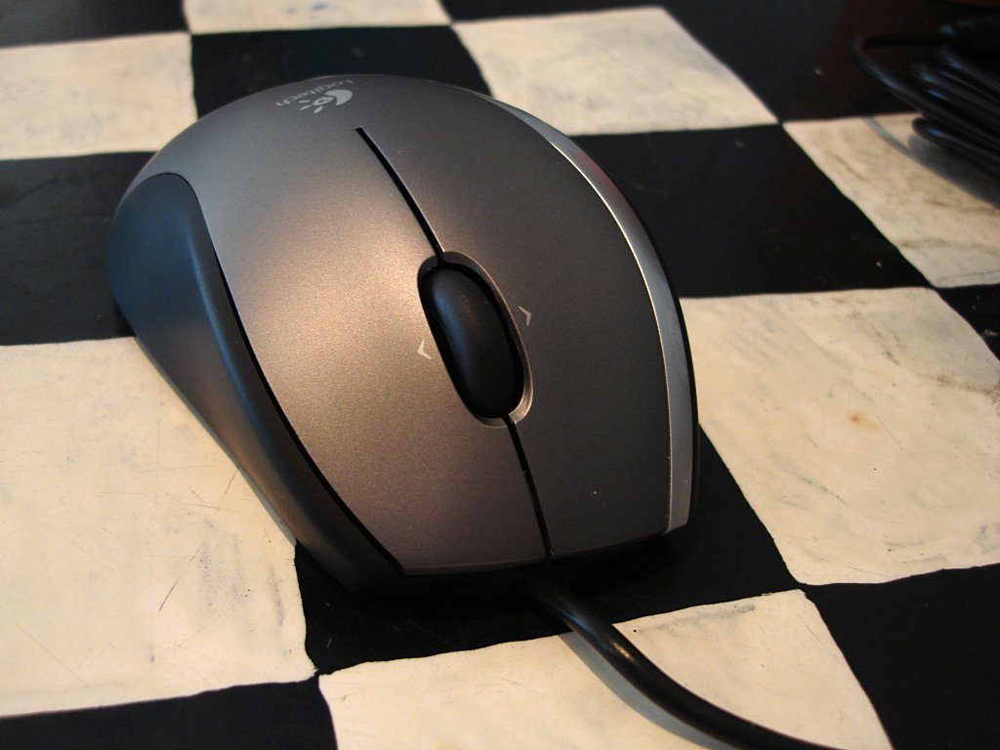

In [ ]:
import os
# Read in a random image from the training directory
train_img = cv2.imread(valid_path + random.sample(os.listdir(valid_path), 1)[0])
cv2_imshow(train_img)

## Combine images with labels (preprocess data)


```
# Example of a Detectron2 label for image "1e2c50b991a82ee8.jpg"
[{'annotations': [{'bbox': [228.0, 12.0, 791.0, 858.0],
                   'bbox_mode': <BoxMode.XYXY_ABS: 0>,
                   'category_id': 0}],
  'file_name': './cmaker-fireplace-valid/1e2c50b991a82ee8.jpg', # this will change depending on where your images are stored
  'height': 867,
  'image_id': 33,
  'width': 1024}]
```

In [ ]:
# Define the two target classes we're working with (tidbit: in my experience, I found having them in alphabetical order helps prevent confusion later on)
subset_classes = ["Computer keyboard","Computer monitor","Computer mouse","Lamp","Laptop","Microphone"]

In [ ]:
def get_image_ids(image_folder=None):
    """
    Explores a folder of images and gets their ID from their file name.
    Returns a list of all image ID's in image_folder.
    E.g. image_folder/608fda8c976e0ac.jpg -> ["608fda8c976e0ac"]
    
    Params
    ------
    image_folder (str): path to folder of images, e.g. "../validation/"
    """
    return [os.path.splitext(img_name)[0] for img_name in os.listdir(image_folder) if img_name.endswith(".jpg")]

In [ ]:
# Find the image IDs in the validation images folder
val_img_ids = get_image_ids(valid_path)

# Return the first 5 validation image IDs
val_img_ids[:5]

print(len(val_img_ids))

301


In [ ]:
# View unformatted annotations (as downloaded from Open Images)
val_annots = pd.read_csv("validation-annotations-bbox.csv")
val_annots.head()

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside
0,0001eeaf4aed83f9,xclick,/m/0cmf2,1,0.022673,0.964200,0.071038,0.800546,0,0,0,0,0
1,000595fe6fee6369,xclick,/m/02wbm,1,0.000000,1.000000,0.000000,1.000000,0,0,1,0,0
2,000595fe6fee6369,xclick,/m/02xwb,1,0.141384,0.179676,0.676275,0.731707,0,0,0,0,0
3,000595fe6fee6369,xclick,/m/02xwb,1,0.213549,0.253314,0.299335,0.354767,1,0,0,0,0
4,000595fe6fee6369,xclick,/m/02xwb,1,0.232695,0.288660,0.490022,0.545455,1,0,0,0,0


In [ ]:
# Make a function which formats a specific annotations csv based on what we're dealing with
def format_annotations(image_folder, annotation_file, target_classes=None):
    """
    Formats annotation_file based on images contained in image_folder.
    Will get all unique image IDs and make sure annotation_file
    only contains those (the target images).
    Adds meta-data to annotation_file such as class names and categories.
    If target_classes isn't None, the returned annotations will be filtered by this list.
    Note: image_folder and annotation_file should both be validation if working on
    validation set or both be training if working on training set.
    
    Params
    ------
    image_folder (str): path to folder of target images.
    annotation_file (str): path to annotation file of target images.
    target_classes (list), optional: a list of target classes you'd like to filter labels.
    """
    # Get all image ids from target directory
    image_ids = get_image_ids(image_folder)
    
    # Setup annotation file and classnames
    annot_file = pd.read_csv(annotation_file)
 
    classes = pd.read_csv("class-descriptions-boxable.csv",
                          names=["LabelName", "ClassName"])


    
    # Create classname column on annotations which converts label codes to string labels
    annot_file["ClassName"] = annot_file["LabelName"].map(classes.set_index("LabelName")["ClassName"])
    
    new = annot_file["ImageID"].isin(image_ids)


    # Sort annot_file by "ClassName" for alphabetical labels (used with target_classes)
    annot_file.sort_values(by=["ClassName"], inplace=True)
  
    # Make sure we only get the images we're concerned about
    if target_classes:
        annot_file = annot_file[annot_file["ImageID"].isin(image_ids) & annot_file["ClassName"].isin(target_classes)]
  
        

        
    else:
        annot_file = annot_file[annot_file["ImageID"].isin(image_ids)]

    
    
    assert len(annot_file.ImageID.unique()) == len(image_ids), "Label unique ImageIDs doesn't match target folder."


    # Add ClassID column, e.g. "Bathtub, Toilet" -> 1, 2
    annot_file["ClassName"] = pd.Categorical(annot_file["ClassName"])
    annot_file["ClassID"] = annot_file["ClassName"].cat.codes
    
    return annot_file

In [ ]:
# Test our annotation formatting function
val_annots_formatted = format_annotations(image_folder=valid_path,
                                          annotation_file="validation-annotations-bbox.csv",
                                          target_classes=subset_classes) 

val_annots_formatted.head()

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside,ClassName,ClassID
90112,4bd22ced20a97685,xclick,/m/01m2v,1,0.000000,1.000000,0.055422,0.795181,0,0,0,0,0,Computer keyboard,0
218749,b7640a870db80373,xclick,/m/01m2v,1,0.607670,0.880531,0.829646,0.962389,0,0,0,0,0,Computer keyboard,0
154432,82ec287514404742,xclick,/m/01m2v,1,0.000000,1.000000,0.000000,1.000000,0,1,0,0,0,Computer keyboard,0
218748,b7640a870db80373,xclick,/m/01m2v,1,0.411504,0.699115,0.623894,0.714602,0,0,0,0,0,Computer keyboard,0
155936,843b65da2d2f213e,xclick,/m/01m2v,1,0.000000,1.000000,0.000000,1.000000,0,0,1,0,0,Computer keyboard,0


In [ ]:
# See different integer identifiers of our target classes
val_annots_formatted[["ClassName", "ClassID"]]

,ClassName,ClassID
90112,Computer keyboard,0
218749,Computer keyboard,0
154432,Computer keyboard,0
218748,Computer keyboard,0
155936,Computer keyboard,0
...,...,...
233496,Microphone,5
40865,Microphone,5
34174,Microphone,5
257063,Microphone,5


In [ ]:
# Check the lengths of formatted and unformatted validation annotations
len(val_annots), len(val_annots_formatted)

(303980, 480)

In [ ]:
def rel_to_absolute(bbox, height, width):
    """
    Converts bounding box dimensions from relative to absolute pixel values (Detectron2 style).
    See: https://detectron2.readthedocs.io/modules/structures.html#detectron2.structures.BoxMode
    
    Params
    ------
    bbox (array): relative dimensions of bounding box in format (x0, y0, x1, y1 or Xmin, Ymin, Xmax, Ymax)
    height (int): height of image
    width (int): width of image
    """
    bbox[0] = np.round(np.multiply(bbox[0], width)) # x0
    bbox[1] = np.round(np.multiply(bbox[1], height)) # y0
    bbox[2] = np.round(np.multiply(bbox[2], width)) # x1
    bbox[3] = np.round(np.multiply(bbox[3], height)) # y1
    return [i.astype("object") for i in bbox] # convert all to objects for JSON saving

In [ ]:
# Sample row we're going to convert
val_annots_formatted.head(1)

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside,ClassName,ClassID
90112,4bd22ced20a97685,xclick,/m/01m2v,1,0.0,1.0,0.055422,0.795181,0,0,0,0,0,Computer keyboard,0


In [ ]:
# Get sample image height and width
height, width = cv2.imread(valid_path+val_annots_formatted.loc[90112]["ImageID"]+".jpg").shape[:2]

# Get array of bounding box for sample image
relative_bbox = val_annots_formatted.loc[90112][["XMin", "XMax", "YMin", "YMax"]].values
print(f"Relative bbox: {relative_bbox}")

# Convert sample image bounding box coordinates
absolute_bbox = rel_to_absolute(relative_bbox, height, width)
print(f"Absolute bbox: {absolute_bbox}")

Relative bbox: [0.0 1.0 0.055421688 0.79518074]
Absolute bbox: [0.0, 576.0, 57.0, 458.0]


In [ ]:


def get_image_dicts(image_folder, annotation_file, target_classes=None):
    """
    Create Dectectron2 style labels in the form of a list of dictionaries.
    
    Params
    ------
    image_folder (str): target folder containing images
    annotations (DataFrame): DataFrame of image label data
    target_classes (list): names of target Open Images classes

    Note: image_folder and annotation_file should both relate to the same dataset (this could be improved).
    E.g.
    image_folder = valid_images & annotation_file = valid_annotations (both are for the validation set)
    """
    # Get name of dataset from image_folder 
    dataset_name = str(image_folder)

    # Create dataset specific annotations.
    annotations = format_annotations(image_folder=image_folder, 
                                     annotation_file=annotation_file,
                                     target_classes=target_classes)

    # Get all unique image ids from target folder
    img_ids = get_image_ids(image_folder)

    # Add some verbosity 
    print(f"\nUsing {annotation_file} for annotations...")
    print(f"On dataset: {dataset_name}")
    print("Classes we're using:\n{}".format(annotations["ClassName"].value_counts()))
    print(f"Total number of images: {len(img_ids)}")
    
    # Start creating image dictionaries (Detectron2 style labelling)
    img_dicts = []
    for idx, img in tqdm(enumerate(img_ids)):
        record = {}
        
        # Get image metadata
        file_name = image_folder + img + ".jpg"
        height, width = cv2.imread(file_name).shape[:2]
        img_data = annotations[annotations["ImageID"] == img].reset_index() # reset_index(): important for images
                                                                            # with multiple objects
        # Verbosity for image label troubleshooting
        # print(f"On image: {img}")
        # print(f"Image category: {img_data.ClassID.values}")
        # print(f"Image label: {img_data.ClassName.values}")

        # Update record dictionary
        record["file_name"] = file_name
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width
        
        # Create list of image annotations (labels)
        img_annotations = []
        for i in range(len(img_data)): # this is where we loop through examples with multiple objects in an image
            category_id = img_data.loc[i]["ClassID"].astype("object") # JSON (for evalution) can't take int8 (NumPy type) must be native Python type
            # Get bounding box coordinates in Detectron2 style (x0, y0, x1, y1)
            bbox = np.float32(img_data.loc[i][["XMin", "YMin", "XMax", "YMax"]].values)
            # Convert bbox from relative to absolute pixel dimensions
            bbox = rel_to_absolute(bbox=bbox, height=height, width=width)
            # Setup annot (1 annot = 1 label, there might be more) dictionary
            annot = {
                "bbox": bbox, 
                "bbox_mode": BoxMode.XYXY_ABS, # See: https://detectron2.readthedocs.io/modules/structures.html#detectron2.structures.BoxMode.XYXY_ABS
                "category_id": category_id
            }
            img_annotations.append(annot)
            
        # Update record dictionary with annotations
        record["annotations"] = img_annotations
        
        # Add record dictionary with image annotations to img_dicts list
        img_dicts.append(record)

    # Save img_dicts to JSON for use later
    prefix = "valid" if "valid" in image_folder else "train"
    json_file = os.path.join(image_folder, prefix + "_labels.json")
    print(f"\nSaving labels to: {json_file}...")
    with open(json_file, "w") as f:
      json.dump(img_dicts, f)

    print("Showing an example:")
    pprint.pprint(random.sample(img_dicts, 1))

    # return img labels dictionary
    return img_dicts

In [ ]:
# Create list of validation image dictionaries


%%time
val_img_dicts = get_image_dicts(image_folder=valid_path,
                                annotation_file="validation-annotations-bbox.csv",
                                target_classes=subset_classes)

6it [00:00, 50.99it/s]


Using validation-annotations-bbox.csv for annotations...
On dataset: ./sample_data/validation/
Classes we're using:
Microphone           140
Computer monitor     100
Lamp                  79
Laptop                70
Computer keyboard     67
Computer mouse        24
Name: ClassName, dtype: int64
Total number of images: 301


301it [00:05, 52.71it/s]


Saving labels to: ./sample_data/validation/valid_labels.json...
Showing an example:
[{'annotations': [{'bbox': [294.0, 144.0, 409.0, 199.0],
                   'bbox_mode': <BoxMode.XYXY_ABS: 0>,
                   'category_id': 5}],
  'file_name': './sample_data/validation/dad58c8b0adc421e.jpg',
  'height': 784,
  'image_id': 111,
  'width': 768}]
CPU times: user 6.34 s, sys: 115 ms, total: 6.46 s
Wall time: 6.43 s


In [ ]:
# Create list of training image dictionaries
%%time
train_img_dicts = get_image_dicts(image_folder=train_path,
                                  annotation_file="train-annotations-bbox.csv",
                                  target_classes=subset_classes)

6it [00:00, 49.43it/s]


Using train-annotations-bbox.csv for annotations...
On dataset: ./sample_data/train/
Classes we're using:
Lamp                 3663
Laptop               3361
Computer keyboard    1958
Computer monitor     1690
Microphone           1545
Computer mouse        733
Name: ClassName, dtype: int64
Total number of images: 6453


6453it [02:21, 45.45it/s]



Saving labels to: ./sample_data/train/train_labels.json...
Showing an example:
[{'annotations': [{'bbox': [828.0, 47.0, 1012.0, 562.0],
                   'bbox_mode': <BoxMode.XYXY_ABS: 0>,
                   'category_id': 3}],
  'file_name': './sample_data/train/9820d3f3d56eb9cb.jpg',
  'height': 819,
  'image_id': 928,
  'width': 1024}]
CPU times: user 2min 56s, sys: 4.3 s, total: 3min
Wall time: 3min


In [ ]:
def load_json_labels(image_folder):
    """
    Returns Detectron2 style labels of images (list of dictionaries) in image_folder based on JSON label file in image_folder.

    Note: Requires JSON label to be in image_folder. See get_image_dicts(). 
    
    Params
    ------
    image_folder (str): target folder containing images
    """
    # Get absolute path of JSON label file
    for file in os.listdir(image_folder):
      if file.endswith(".json"):
        json_file = os.path.join(image_folder, file)

    # Check to see if json_file exists 
    assert json_file, "No .json label file found, please make one with get_image_dicts()"

    with open(json_file, "r") as f:
      img_dicts = json.load(f)

    # Convert bbox_mode to Enum of BoxMode.XYXY_ABS (doesn't work loading normal from JSON)
    for img_dict in img_dicts:
      for annot in img_dict["annotations"]:
        annot["bbox_mode"] = BoxMode.XYXY_ABS

    return img_dicts

In [ ]:
# Load validation image dictionaries and view an example
loaded_val_img_dicts = load_json_labels(valid_path)
loaded_val_img_dicts[0]

{'annotations': [{'bbox': [437.0, 387.0, 527.0, 475.0],
   'bbox_mode': <BoxMode.XYXY_ABS: 0>,
   'category_id': 1}],
 'file_name': './sample_data/validation/b7f6b21159648814.jpg',
 'height': 724,
 'image_id': 0,
 'width': 1024}

In [ ]:
# Load training image dictionaries and view an example
loaded_train_img_dicts = load_json_labels(train_path)
loaded_train_img_dicts[0]

{'annotations': [{'bbox': [681.0, 369.0, 892.0, 424.0],
   'bbox_mode': <BoxMode.XYXY_ABS: 0>,
   'category_id': 5},
  {'bbox': [290.0, 346.0, 521.0, 406.0],
   'bbox_mode': <BoxMode.XYXY_ABS: 0>,
   'category_id': 5}],
 'file_name': './sample_data/train/ea08ed2e4e45e451.jpg',
 'height': 683,
 'image_id': 0,
 'width': 1024}

#Register custom data

In [ ]:
# Loop through different datasets
for dataset in ["train", "valid"]:
  
     # Create dataset name strings
     #dataset_name = "cmouse-laptop-" + dataset

     if dataset=="train":
       dataset_name= train_path
     elif dataset=="valid":
       dataset_name= valid_path

     print(f"Registering {dataset_name}")

     # Register the datasets with Detectron2's DatasetCatalog, which has space for a lambda function to preprocess it
     DatasetCatalog.register(dataset_name, lambda dataset_name=dataset_name: load_json_labels(dataset_name))

     # Create the metadata for our dataset (the main thing being the classnames we're using)
     MetadataCatalog.get(dataset_name).set(thing_classes=subset_classes)

# Setup metadata variable
metadata = MetadataCatalog.get(train_path)

Registering ./sample_data/train/
Registering ./sample_data/validation/


In [ ]:
DatasetCatalog._REGISTERED

In [ ]:
## Example of how to remove registered datasets (uncomment only if you need to)
DatasetCatalog._REGISTERED.pop(train_path) # remove our training dataset
DatasetCatalog._REGISTERED.pop(valid_path) # remove our validation dataset

<function __main__.<lambda>>

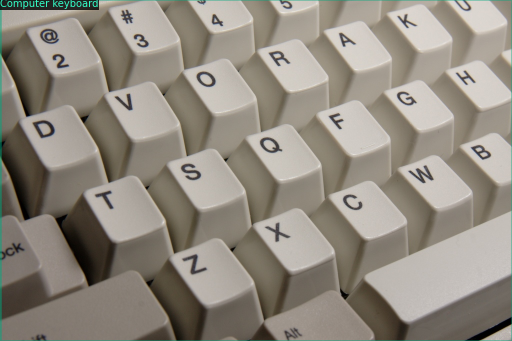

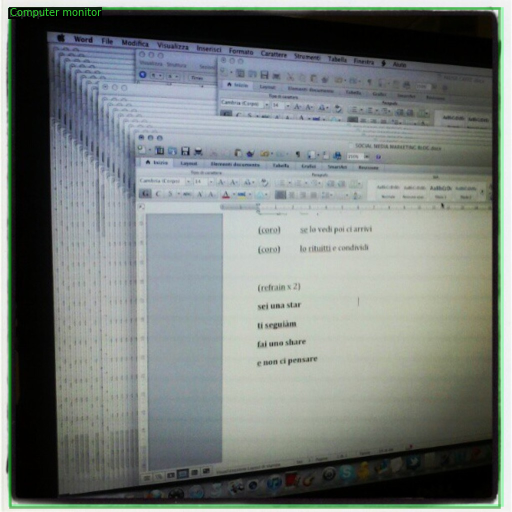

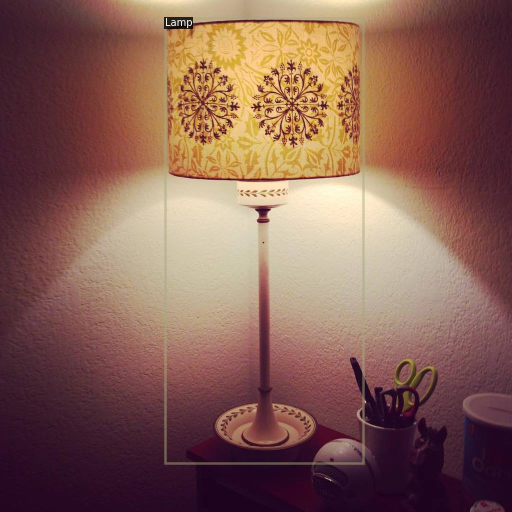

In [ ]:
#check works

for label in random.sample(val_img_dicts, 3):
    img = cv2.imread(label["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], # revervse the image pixel order (BGR -> RGB)
                            metadata=metadata, # use the metadata variable we created about
                            scale=0.5)
    vis = visualizer.draw_dataset_dict(label)
    cv2_imshow(vis.get_image()[:, :, ::-1])

#Training the model

In [ ]:
import logging
import os
import argparse
from collections import OrderedDict
import pandas as pd
import numpy as np
import torch
from torch.nn.parallel import DistributedDataParallel

import detectron2.utils.comm as comm
from detectron2.checkpoint import DetectionCheckpointer, PeriodicCheckpointer
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.data import (
    MetadataCatalog,
    build_detection_test_loader,
    build_detection_train_loader,
)
from detectron2.engine import default_argument_parser, default_setup, launch
from detectron2.evaluation import ( ### Changes from original, I don't need all the different evaluators
    COCOEvaluator,
    DatasetEvaluators,
    inference_on_dataset,
    print_csv_format
)
from detectron2.modeling import build_model
from detectron2.solver import build_lr_scheduler, build_optimizer
# Not sure what these do but they may help to track experiments
from detectron2.utils.events import (
    CommonMetricPrinter,
    EventStorage,
    JSONWriter,
    TensorboardXWriter
)

from detectron2.utils.visualizer import Visualizer

# Setup logger
logger = logging.getLogger("detectron2")

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

# Setup a model config (recipe for training a Detectron2 model)
cfg=get_cfg()

# Add some basic instructions for the Detectron2 model from the model_zoo: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md
cfg.merge_from_file(model_zoo.get_config_file('COCO-Detection/retinanet_R_101_FPN_3x.yaml'))

# Add some pretrained model weights from an object detection model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url('COCO-Detection/retinanet_R_101_FPN_3x.yaml')

# Setup datasets to train/validate on (this will only work if the datasets are registered with DatasetCatalog)
cfg.DATASETS.TRAIN = (train_path,)
cfg.DATASETS.TEST = (valid_path,)

# How many dataloaders to use? This is the number of CPUs to load the data into Detectron2, Colab has 2, so we'll use 2
cfg.DATALOADER.NUM_WORKERS = 2

# How many images per batch? The original models were trained on 8 GPUs with 16 images per batch, since we have 1 GPU: 16/8 = 2.
cfg.SOLVER.IMS_PER_BATCH = 2

# We do the same calculation with the learning rate as the GPUs, the original model used 0.01, so we'll divide by 8: 0.01/8 = 0.00125.
cfg.SOLVER.BASE_LR = 0.00025

# How many iterations are we going for? (300 is okay for our small model, increase for larger datasets)
cfg.SOLVER.MAX_ITER = 4000

# ROI = region of interest, as in, how many parts of an image are interesting, how many of these are we going to find? 
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256

# number of classes we dealing with
cfg.MODEL.RETINANET.NUM_CLASSES = 6

# Setup output directory, all the model artefacts will get stored here in a folder called "outputs" 
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Setup the default Detectron2 trainer, see: https://detectron2.readthedocs.io/modules/engine.html#detectron2.engine.defaults.DefaultTrainer
trainer = DefaultTrainer(cfg)

# Resume training from model checkpoint or not, we're going to just load the model in the config: https://detectron2.readthedocs.io/modules/engine.html#detectron2.engine.defaults.DefaultTrainer.resume_or_load
trainer.resume_or_load(resume=False) 

# Start training
trainer.train()

Loading config /usr/local/lib/python3.6/dist-packages/detectron2/model_zoo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


RuntimeError: ignored

In [ ]:
# Changed from original: Create evaluator for COCOEvaluator only 
# Since we are only using bounding boxes to begin with, our evaluator can be simple COCO style
def get_evaluator(cfg, dataset_name, output_folder=None):
  """
  Create a COCOEvaluator
  """
  if output_folder is None:
    output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
  evaluator = COCOEvaluator(
      dataset_name=dataset_name,
      cfg=cfg,
      distributed=False,
      output_dir=output_folder
  )
  return evaluator

In [ ]:
# Create testing function
def do_test(cfg, model):
  results = OrderedDict()
  for dataset_name in cfg.DATASETS.TEST:
    data_loader = build_detection_test_loader(cfg, dataset_name)
    # Create the evaluator
    evaluator = get_evaluator(
        cfg, 
        dataset_name,
        output_folder=os.path.join(cfg.OUTPUT_DIR, "inference", dataset_name)
    )
    # Make inference on dataset
    results_i = inference_on_dataset(model,
                                     data_loader,
                                     evaluator)
    # Update results dictionary
    results[dataset_name] = results_i

    print("### Returning results_i...")
    #print(results_i)
    #print(f"### Average Precision: {results_i['AP']}")
    # Let's get some communication happening
    if comm.is_main_process():
      logger.info("Evaluation results for {} in csv format:".format(dataset_name))
      ## wandb.log()? TODO/NOTE: This may be something Weights & Biases can track
      #print("### Calculating results...")
      print_csv_format(results_i)
    
    # Check to see length of results
    if len(results) == 1:
      results = list(results.values())[0]
    #print("### Returning results...")
    #print(results)

    # TODO : log results_i dict with different parameters
    print("### Saving results to Weights & Biases...")
    wandb.log(results_i)

    return results

In [ ]:
# Create training function
def do_train(cfg, model, resume=False):
  # Set model to training mode
  model.train()
  # Create optimizer from config file (returns torch.nn.optimizer.Optimizer)
  optimizer = build_optimizer(cfg, model)
  # Create scheduler for learning rate (returns torch.optim.lr._LR_scheduler)
  scheduler = build_lr_scheduler(cfg, optimizer)
  print(f"Scheduler: {scheduler}")

  # Create checkpointer
  checkpointer = DetectionCheckpointer(
      model, save_dir=cfg.OUTPUT_DIR, optimizer=optimizer, scheduler=scheduler
  )

  # Create start iteration (refernces checkpointer) - https://detectron2.readthedocs.io/modules/checkpoint.html#detectron2.checkpoint.Checkpointer.resume_or_load
  start_iter = (
      # This can be 0
      checkpointer.resume_or_load(cfg.MODEL.WEIGHTS, # Use predefined model weights (pretrained model)
                                  resume=resume).get("iteration", -1) + 1
  )
  # Set max number of iterations
  max_iter = cfg.SOLVER.MAX_ITER

  # Create periodiccheckpoint
  periodic_checkpointer = PeriodicCheckpointer(checkpointer=checkpointer,
                                               # How often to make checkpoints?
                                               period=cfg.SOLVER.CHECKPOINT_PERIOD,
                                               max_iter=max_iter)
  
  # Create writers (for saving checkpoints?)
  writers = (
      [
       # Print out common metrics such as iteration time, ETA, memory, all losses, learning rate
       CommonMetricPrinter(max_iter=max_iter),
       # Write scalars to a JSON file such as loss values, time and more
       JSONWriter(os.path.join(cfg.OUTPUT_DIR, "metrics.json")),
       # Write all scalars such as loss values to a TensorBoard file for easy visualization
       TensorboardXWriter(cfg.OUTPUT_DIR),
      ]
      if comm.is_main_process()
      else []
  )

  ### Original note from script: ###
  # compared to "train_net.py", we do not support accurate timing and precise BN
  # here, because they are not trivial to implement

  # Build a training data loader based off the training dataset name in the config
  data_loader = build_detection_train_loader(cfg)

  # Start logging
  logger.info("Starting training from iteration {}".format(start_iter))

  # Store events
  with EventStorage(start_iter) as storage:
    # Loop through zipped data loader and iteration
    for data, iteration in zip(data_loader, range(start_iter, max_iter)):
      iteration = iteration + 1
      storage.step() # update stroage with step - https://detectron2.readthedocs.io/modules/utils.html#detectron2.utils.events.EventStorage.step

      # Create loss dictionary by trying to model data
      loss_dict = model(data)
      losses = sum(loss_dict.values())
      # Are losses infinite? If so, something is wrong
      assert torch.isfinite(losses).all(), loss_dict

      # TODO - Not quite sure what's happening here
      loss_dict_reduced = {k: v.item() for k, v in comm.reduce_dict(loss_dict).items()}
      # Sum up losses
      losses_reduced = sum(loss for loss in loss_dict_reduced.values())
      
      # # TODO: wandb.log()? log the losses
      # wandb.log({
      #     "Total loss": losses_reduced
      # })

      # Update storage
      if comm.is_main_process():
        # Store informate in storage - https://detectron2.readthedocs.io/modules/utils.html#detectron2.utils.events.EventStorage.put_scalars
        storage.put_scalars(total_loss=losses_reduced,
                            **loss_dict_reduced)
      
      # Start doing PyTorch things
      optimizer.zero_grad()
      losses.backward()
      optimizer.step()
      # Add learning rate to storage information
      storage.put_scalar("lr", optimizer.param_groups[0]["lr"], smoothing_hint=False)
      # This is required for your learning rate to change!!!! (not having this meant my learning rate was staying at 0)
      scheduler.step()

      # Perform evaluation?
      if (
          cfg.TEST.EVAL_PERIOD > 0
          and iteration % cfg.TEST.EVAL_PERIOD == 0
          and iteration != max_iter
      ):
          do_test(cfg, model)
          # TODO - compared to "train_net.py", the test results are not dumped to EventStorage
          comm.synchronize()
      
      # Log different metrics with writers
      if iteration - start_iter > 5 and (iteration % 20 == 0 or iteration == max_iter):
        for writer in writers:
          writer.write()
      
      # Update the periodic_checkpointer
      periodic_checkpointer.step(iteration)

In [ ]:
# Create setup function
def setup(args):
  """
  Create configs and perform basic setups.
  """
  cfg = get_cfg()
  cfg.merge_from_file(args.config_file) # This will take some kind of model.yaml file
  cfg.merge_from_list(args.opts)
  cfg.freeze()
  default_setup(
      cfg, args
  ) # this logs the config and arguments passed to the command line to the output file

  # Load config YAML as dict
  cfg_yaml = cfg.load_yaml_with_base(os.path.join(cfg.OUTPUT_DIR, "config.yaml"))

  # default_config = get_cfg()
  # default_config_loaded = default_config.load_yaml_with_base("output/config.yaml")
  # default_config_loaded

  # TODO: turn config into YAML and save to weights & biases
  # TODO: Init wandb and add configs
  # Setup a new weights & biases run every time we run the setup() function
  wandb.init(project="DetectMySetup", 
             sync_tensorboard=True)
  
  #print("### Printing config_yaml file to go into Weights & Biases")
  #print(cfg_yaml)
  wandb.config.update(cfg_yaml)

  return cfg

In [ ]:
# Create main function
def main(args):
  
  # Create the config file
  cfg = setup(args)

  # Build the model
  model = build_model(cfg)
  
  # Log what's going on
  logger.info("Model:\n{}".format(model))

  # TODO: Fix this (if it doesn't work)
  #wandb.watch(model, log="all")

  # Only do evaluation if the args say so
  if args.eval_only:
    DetectionCheckpointer(model, save_dir=cfg.OUTPUT_DIR).resume_or_load(
        cfg.MODEL.WEIGHTS, resume=args.resume
    )
    return do_test(cfg, model)

  # Do distributed training? (depends on number of GPUs available)
  distributed = comm.get_world_size() > 1
  if distributed:
    # Put the model on multiple devices if available
    model = DistributedDataParallel(
        model, 
        device_ids=[comm.get_local_rank()], 
        broadcast_buffers=False
    )

  # Train the model
  do_train(cfg, model)
  # TODO - May want to evaluate in a different step?
  return do_test(cfg, model)

In [ ]:

models_to_try = {'R101-FPN-3x': 'COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml',
 'R50-FPN-1x': 'COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml',
 'R50-FPN-3x': 'COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml',
 'RN-R101-3x': 'COCO-Detection/retinanet_R_101_FPN_3x.yaml',
 'RN-R50-1x': 'COCO-Detection/retinanet_R_50_FPN_1x.yaml',
 'RN-R50-3x': 'COCO-Detection/retinanet_R_50_FPN_3x.yaml',
 'X101-FPN-3x': 'COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml'}

In [ ]:
# Setup different weights and config files to try
weights = []
configs = []
for k, v in models_to_try.items():
  model = models_to_try[k]
  model_weights = model_zoo.get_checkpoint_url(model)
  weights.append(model_weights)
  config_file = model_zoo.get_config_file(model)
  configs.append(config_file)
weights_configs = dict(zip(weights, configs))
weights_configs

{'https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_R_101_FPN_3x/137851257/model_final_f6e8b1.pkl': '/usr/local/lib/python3.6/dist-packages/detectron2/model_zoo/configs/COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml',
 'https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_R_50_FPN_1x/137257794/model_final_b275ba.pkl': '/usr/local/lib/python3.6/dist-packages/detectron2/model_zoo/configs/COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml',
 'https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl': '/usr/local/lib/python3.6/dist-packages/detectron2/model_zoo/configs/COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml',
 'https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x/139173657/model_final_68b088.pkl': '/usr/local/lib/python3.6/dist-packages/detectron2/model_zoo/configs/COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml',
 'https://dl.fbaipublicfiles.com/detectron2/COCO-Det

In [ ]:
# Setup different arg strings to pass to main() 
workers = 2
ims_per_batch = 2
lr = 0.00025
max_iter = 300
seed = 33
num_classes = len(subset_classes)

arg_strings = []
for weights, config in weights_configs.items():
  arg_string = f"--config-file {config} \
                MODEL.WEIGHTS {weights} \
                DATASETS.TRAIN ('train',) \
                DATASETS.TEST ('validation',) \
                DATALOADER.NUM_WORKERS {workers} \
                SOLVER.IMS_PER_BATCH {ims_per_batch} \
                SOLVER.BASE_LR {lr} \
                SOLVER.MAX_ITER {max_iter} \
                SEED {seed} \
                MODEL.ROI_HEADS.NUM_CLASSES {num_classes}".split()
  arg_strings.append(arg_string)

In [ ]:

# Setup arg parser
parser = default_argument_parser() # default in Detectron2
# Create different arg parsers
arg_list = []
for arg_string in arg_strings:
  args = parser.parse_args(arg_string)
  print(args)
  arg_list.append(args)

Namespace(config_file='/usr/local/lib/python3.6/dist-packages/detectron2/model_zoo/configs/COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml', dist_url='tcp://127.0.0.1:49152', eval_only=False, machine_rank=0, num_gpus=1, num_machines=1, opts=['MODEL.WEIGHTS', 'https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_R_101_FPN_3x/137851257/model_final_f6e8b1.pkl', 'DATASETS.TRAIN', "('train',)", 'DATASETS.TEST', "('validation',)", 'DATALOADER.NUM_WORKERS', '2', 'SOLVER.IMS_PER_BATCH', '2', 'SOLVER.BASE_LR', '0.00025', 'SOLVER.MAX_ITER', '300', 'SEED', '33', 'MODEL.ROI_HEADS.NUM_CLASSES', '1'], resume=False)
Namespace(config_file='/usr/local/lib/python3.6/dist-packages/detectron2/model_zoo/configs/COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml', dist_url='tcp://127.0.0.1:49152', eval_only=False, machine_rank=0, num_gpus=1, num_machines=1, opts=['MODEL.WEIGHTS', 'https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_R_50_FPN_1x/137257794/model_final_b275ba.pkl', 'DATAS

In [ ]:
for i, namespace in enumerate(arg_list):
  print(f"Running experiment: {1}") # derp......
  main(namespace)

In [ ]:
# Look at training curves in tensorboard (note: TensorBoard output usually works best in Google Chrome)
%load_ext tensorboard
%tensorboard --logdir output

#Predictions


In [ ]:
# Get the final model weights from the outputs directory
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth") 

# Set the testing threshold (a value between 0 and 1, higher makes it more difficult for a prediction to be made)
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 

# Tell the config what the test dataset is (we've already done this)
cfg.DATASETS.TEST = ("./sample_data/validation/") 

# Setup a default predictor from Detectron2: https://detectron2.readthedocs.io/modules/engine.html#detectron2.engine.defaults.DefaultPredictor
predictor = DefaultPredictor(cfg)

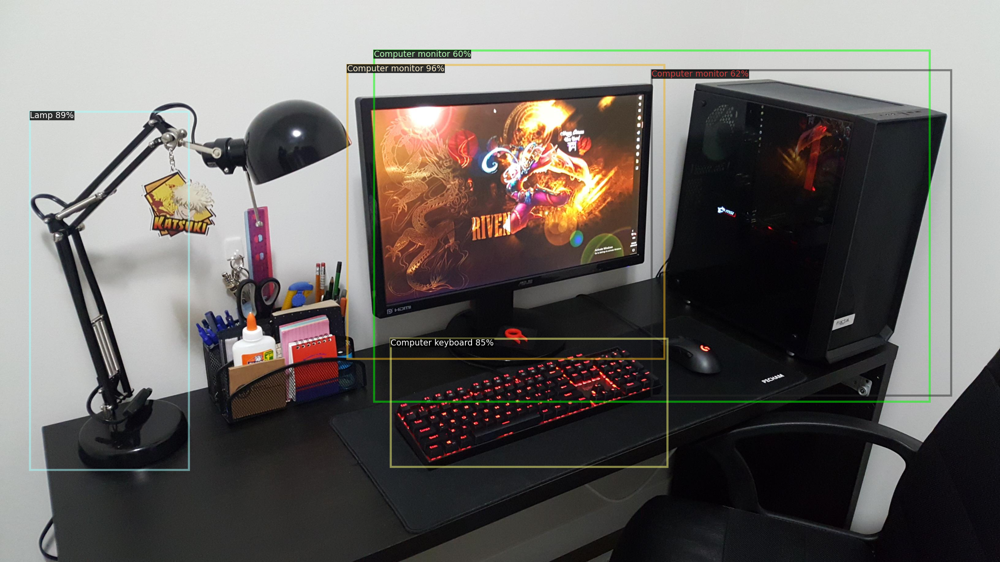

In [ ]:
num_amenities = 5 # how many amenity detections to draw on the image 

img = cv2.imread("./set.jpg")
outputs = predictor(img)
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=metadata,
                        scale=0.7)
visualizer = visualizer.draw_instance_predictions(outputs["instances"][:num_amenities].to("cpu"))
cv2_imshow(visualizer.get_image()[:, :, ::-1])

#Evaluate

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Setup an evaluator, we use COCO because it's one of the standards for object detection: https://detectron2.readthedocs.io/modules/evaluation.html#detectron2.evaluation.COCOEvaluator
evaluator = COCOEvaluator(dataset_name="./sample_data/validation/", 
                          cfg=cfg, 
                          distributed=False, # use multiple GPUs? we're in Colab so we only use one
                          output_dir="./output/")

# Create a dataloader to load in the test data (cmaker-fireplace-valid)
val_loader = build_detection_test_loader(cfg, 
                                         dataset_name="./sample_data/validation/")

# Make inference on the validation dataset: https://detectron2.readthedocs.io/tutorials/evaluation.html
inference_on_dataset(model=trainer.model, # get the model from the trainer
                     data_loader=val_loader, 
                     evaluator=evaluator)

[07/31 15:33:16 d2.evaluation.coco_evaluation]: './sample_data/validation/' is not registered by `register_coco_instances`. Therefore trying to convert it to COCO format ...
[07/31 15:33:16 d2.data.datasets.coco]: Converting annotations of dataset './sample_data/validation/' to COCO format ...)
[07/31 15:33:16 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[07/31 15:33:17 d2.data.datasets.coco]: Conversion finished, #images: 301, #annotations: 480
[07/31 15:33:17 d2.data.datasets.coco]: Caching COCO format annotations at './output/./sample_data/validation/_coco_format.json' ...
[07/31 15:33:17 d2.data.common]: Serializing 301 elements to byte tensors and concatenating them all ...
[07/31 15:33:17 d2.data.common]: Serialized dataset takes 0.08 MiB
[07/31 15:33:17 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[07/31 15:33:17 d2.evaluation.evaluator]: Start inference on 3

OrderedDict([('bbox',
              {'AP': 29.287789240389557,
               'AP-Computer keyboard': 22.38819841008743,
               'AP-Computer monitor': 37.2900196564991,
               'AP-Computer mouse': 22.87940025975289,
               'AP-Lamp': 29.489845425586065,
               'AP-Laptop': 43.083346810157124,
               'AP-Microphone': 20.595924880254717,
               'AP50': 44.88109027511407,
               'AP75': 30.65578114402178,
               'APl': 31.597493977810252,
               'APm': 10.63168424931428,
               'APs': 0.0})])

In [ ]:
# Save config to file
with open("output/config.yaml", "w") as f:
    f.write(cfg.dump())

prediction function

In [ ]:
# Make a prediction and display inferences
def make_inference(image, model_config, model_weights, threshold=0.2, n=1):
  """
  Makes inference on image (single image) using model_config, model_weights and threshold.

  Returns image with n instance predictions drawn on.

  Params:
  -------
  image (str) : file path to target image
  model_config (str) : file path to model config in .yaml format
  model_weights (str) : file path to model weights 
  threshold (float) : confidence threshold for model prediction, default 0.5
  n (int) : number of prediction instances to draw on, default 5
    Note: some images may not have 5 instances to draw on depending on threshold,
    n=5 means the top 5 instances above the threshold will be drawn on.
  save (bool) : if True will save image with predicted instances to file, default False
  """

  # Setup config
  cfg = get_cfg()
  cfg.merge_from_file(model_config)
  cfg.MODEL.WEIGHTS = model_weights
  cfg.MODEL.SCORE_THRESH_TEST = threshold
  cfg.DATASETS.TEST = ("./sample_data/validation/",) 
  
  # Setup predictor
  predictor = DefaultPredictor(cfg)
  img = cv2.imread(image)


  visualizer = Visualizer(img_rgb=img[:, :, ::-1],
                          metadata=metadata,
                          scale=0.7)
  
  outputs = predictor(img) # Outputs: https://detectron2.readthedocs.io/modules/structures.html#detectron2.structures.Instances
  
  # Draw on predictions to image
  visualizer = visualizer.draw_instance_predictions(outputs["instances"][:n].to("cpu"))
  cv2_imshow(visualizer.get_image()[:, :, ::-1])

HI


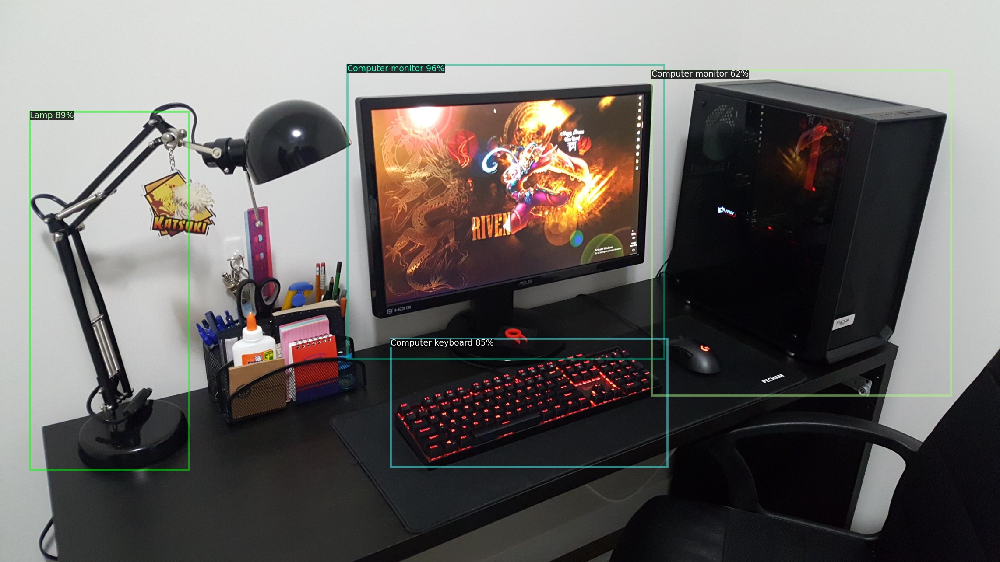

In [ ]:
# Make a prediction with the custom model
make_inference("set.jpg",
               model_config="output/config.yaml",
               model_weights="output/model_final.pth",
               n=4
              )